**Import Packages**

In [2]:
import cv2
import numpy as np

**Load Images**

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
im1 = "/content/drive/MyDrive/6 DoF Pose Estimation/cereal_box_1/full/cereal_box_1_1_1.png"
im2="/content/drive/MyDrive/6 DoF Pose Estimation/cereal_box_1/full/cereal_box_1_1_2.png"
im3 = "/content/drive/MyDrive/6 DoF Pose Estimation/cereal_box_1/full/cereal_box_1_1_3.png"
im4 = "/content/drive/MyDrive/6 DoF Pose Estimation/cereal_box_1/full/cereal_box_1_1_4.png"
im5 = "/content/drive/MyDrive/6 DoF Pose Estimation/cereal_box_1/full/cereal_box_1_1_5.png"

In [5]:
img1=cv2.imread(im1)
img2=cv2.imread(im2)
img3=cv2.imread(im3)
img4=cv2.imread(im4)
img5=cv2.imread(im5)
images = [img1, img2, img3,img4,img5]

**For each set of RGB-D images from different camera views of the same object pose, match keypoints and the obtained Homography Matrix is the Extrinsic Parameters**

In [7]:
from google.colab.patches import cv2_imshow

In [8]:
def extrinsic_parameters(images):
    
    sigma_min = 0.8
    sigma_step = 1.3
    sigma_max = 10.0
    n_scales = 30
    n_octaves = 3

    
    matcher = cv2.BFMatcher_create(cv2.NORM_HAMMING, crossCheck=True)

    
    keypoints = []
    descriptors = []
    for img in images:
        detector = cv2.AKAZE_create(descriptor_type=cv2.AKAZE_DESCRIPTOR_MLDB_UPRIGHT,
                                    threshold=0.0001, nOctaves=n_octaves, nOctaveLayers=n_scales)
        kp = detector.detect(img)
        kp, desc = detector.compute(img, kp)
        keypoints.append(kp)
        descriptors.append(desc)

  
    homographies = []
    for i in range(len(images)-1):
            matches = matcher.match(descriptors[i], descriptors[i+1])
            matches = sorted(matches, key=lambda x: x.distance)[:20]

            img_matches = cv2.drawMatches(images[i], keypoints[i], images[i+1], keypoints[i+1], matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
            print(f"Matches {i}-{i+1}")

            cv2_imshow( img_matches)

            src_pts = np.float32([keypoints[i][m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
            dst_pts = np.float32([keypoints[i+1][m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

            H, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
            homographies.append(H)

    cv2.waitKey(0)
    cv2.destroyAllWindows()

    return homographies

Matches 0-1


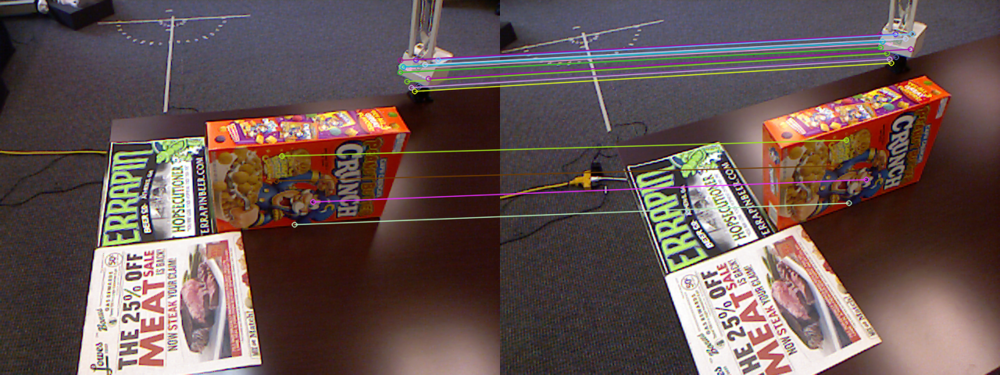

Matches 1-2


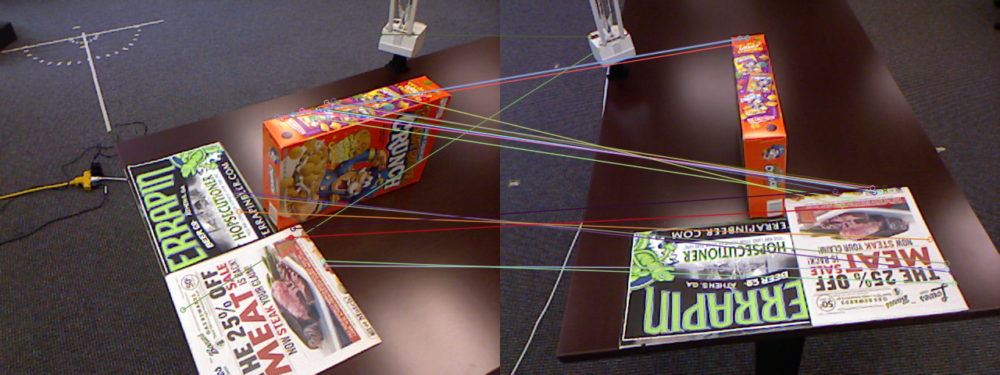

Matches 2-3


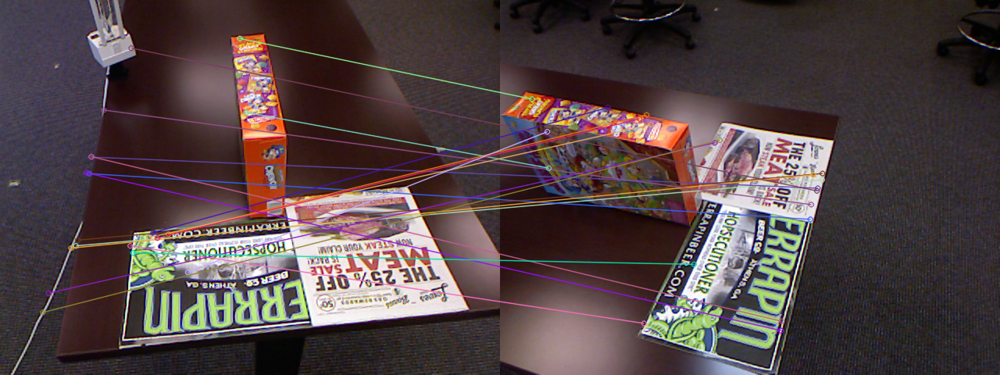

Matches 3-4


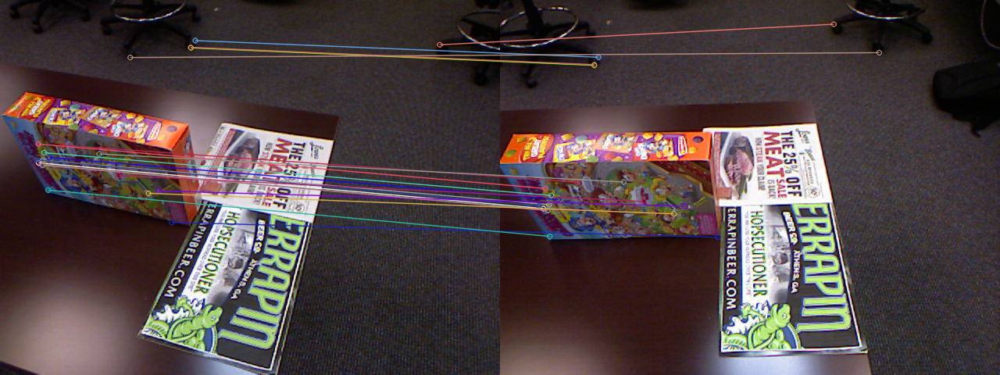

Extrinsic Matrix: [array([[-1.45091836e+00, -4.57316059e-01,  6.49533359e+02],
       [-1.01573494e-01, -3.43198408e-01,  6.67933218e+01],
       [-2.32241305e-03, -9.74485926e-04,  1.00000000e+00]]), array([[-1.04434213e+00, -7.48646970e-01,  4.90164987e+02],
       [-5.38894817e-01, -3.96896225e-01,  2.54673904e+02],
       [-2.14414742e-03, -1.49811613e-03,  1.00000000e+00]]), array([[-2.22723616e+01,  1.11274718e+01,  1.73219545e+03],
       [-2.53292194e+01,  1.55108542e+01,  1.40332541e+03],
       [-4.11348369e-02,  3.78558373e-02,  1.00000000e+00]]), array([[ 1.64424172e+00, -1.59482887e-01,  1.78519206e+01],
       [-2.21119322e-01,  1.61436486e+00, -1.92316430e+00],
       [ 4.38339357e-04,  9.06052152e-04,  1.00000000e+00]])]


In [9]:
homographies1 = extrinsic_parameters(images)
print("Extrinsic Matrix:",homographies1)

**From Different object Poses deteremine the matches between the keypoints of the landmarks hence the Intrinsic Matrix**

**Load Images**

In [21]:
imag1 = "/content/drive/MyDrive/6 DoF Pose Estimation/cereal_box_1/full/cereal_box_1_1_1.png"
imag2="/content/drive/MyDrive/6 DoF Pose Estimation/cereal_box_1/full/cereal_box_1_2_1.png"
imag3 = "/content/drive/MyDrive/6 DoF Pose Estimation/cereal_box_1/full/cereal_box_1_3_1.png"
imag4 = "/content/drive/MyDrive/6 DoF Pose Estimation/cereal_box_1/full/cereal_box_1_4_1.png"
imag5 = "/content/drive/MyDrive/6 DoF Pose Estimation/cereal_box_1/full/cereal_box_1_5_1.png"

In [22]:
image1=cv2.imread(imag1)
image2=cv2.imread(imag2)
image3=cv2.imread(imag3)
image4=cv2.imread(imag4)
image5=cv2.imread(imag5)
images2 = [image1, image2, image3,image4,image5]

In [23]:
def intrinsic_parameters(images):
    # Define parameters for ASIFT keypoints
    sigma_min = 0.8
    sigma_step = 1.3
    sigma_max = 10.0
    n_scales = 30
    n_octaves = 3

    # Create a brute-force matcher object
    matcher = cv2.BFMatcher_create(cv2.NORM_HAMMING, crossCheck=True)

    # Compute ASIFT keypoints and descriptors for each image
    keypoints = []
    descriptors = []
    for img in images:
        detector = cv2.AKAZE_create(descriptor_type=cv2.AKAZE_DESCRIPTOR_MLDB_UPRIGHT,
                                    threshold=0.0001, nOctaves=n_octaves, nOctaveLayers=n_scales)
        kp = detector.detect(img)
        kp, desc = detector.compute(img, kp)
        keypoints.append(kp)
        descriptors.append(desc)

    # Match keypoints and compute homography for each pair of images
    homographies = []
    for i in range(len(images)-1):
            matches = matcher.match(descriptors[i], descriptors[i+1])
            matches = sorted(matches, key=lambda x: x.distance)[:20]

            img_matches = cv2.drawMatches(images[i], keypoints[i], images[i+1], keypoints[i+1], matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
            print(f"Matches {i}-{i+1}")

            cv2_imshow( img_matches)

            src_pts = np.float32([keypoints[i][m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
            dst_pts = np.float32([keypoints[i+1][m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

            H, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
            homographies.append(H)

    cv2.waitKey(0)
    cv2.destroyAllWindows()

    return homographies

Matches 0-1


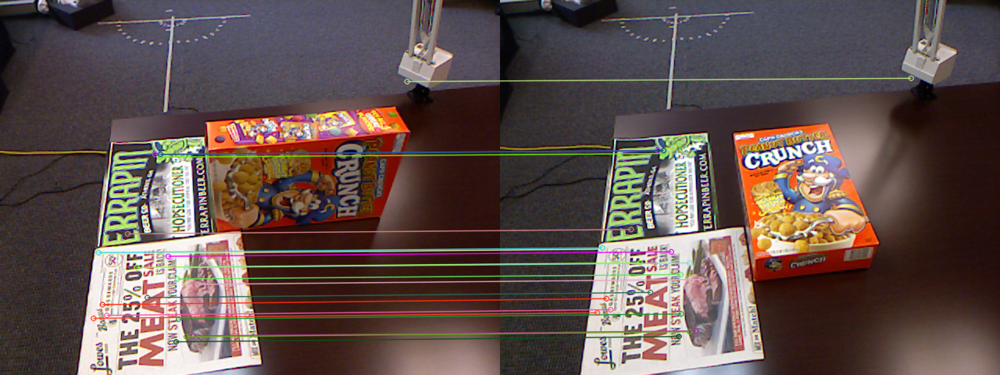

Matches 1-2


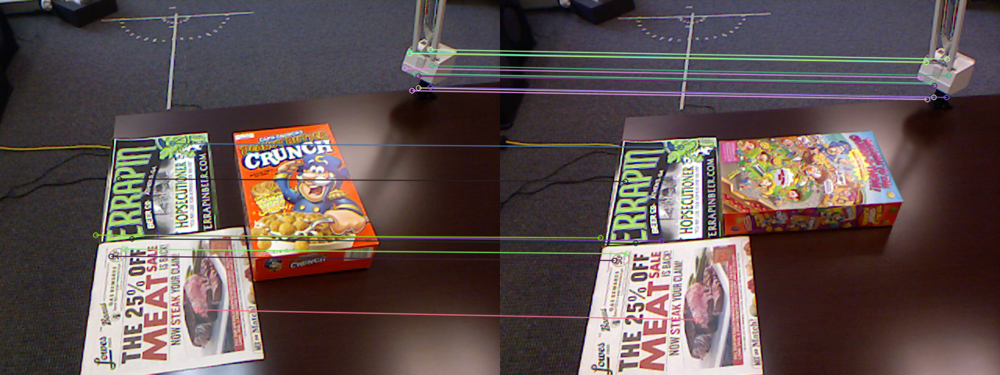

Matches 2-3


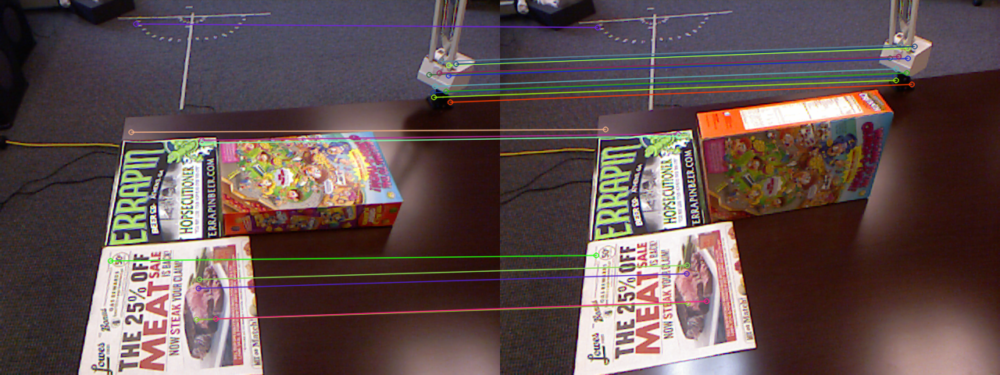

Matches 3-4


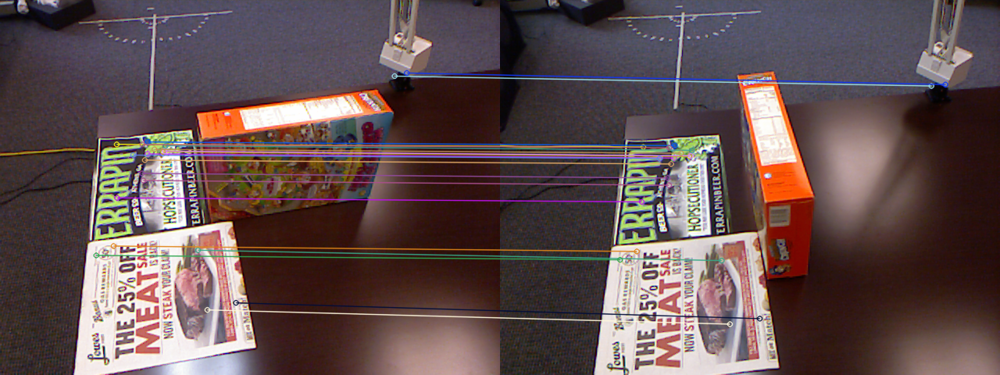

Intrinsic Matrix: [array([[ 9.63434419e-01,  1.28136322e-03,  8.08835410e+00],
       [-2.38758931e-02,  9.79897829e-01,  1.17882879e+00],
       [-8.38742456e-05,  1.03518180e-05,  1.00000000e+00]]), array([[ 9.63148172e-01, -6.69235153e-02,  2.55432144e+01],
       [ 1.78538662e-02,  9.72626265e-01,  1.18911705e+00],
       [-5.77622639e-05, -7.28335599e-05,  1.00000000e+00]]), array([[ 1.08602591e+00,  1.16521324e-01, -6.10817738e+01],
       [-3.86625808e-02,  1.04087193e+00,  3.56453856e+00],
       [ 1.53675972e-04,  1.04228248e-04,  1.00000000e+00]]), array([[ 9.35014086e-01, -3.43456453e-02,  4.54483204e+01],
       [ 7.51621363e-03,  9.95073398e-01, -1.90738122e+00],
       [-1.52675761e-04, -1.99278137e-05,  1.00000000e+00]])]


In [24]:
homographies2 = intrinsic_parameters(images2)
print("Intrinsic Matrix:",homographies2)

**Calculate Projection Matrix**

In [26]:
K_inv = np.linalg.inv(homographies2)
M = np.dot(K_inv, homographies1)
print("Projection Matrix:",M)

Projection Matrix: [[[[-1.48527212e+00 -4.65715700e-01  6.65218284e+02]
   [-1.06451547e+00 -7.63421601e-01  4.99684553e+02]
   [-2.27235745e+01  1.12041365e+01  1.78645218e+03]
   [ 1.70199760e+00 -1.75060498e-01  1.01306229e+01]]

  [[-1.36904866e-01 -3.60371637e-01  8.31029653e+01]
   [-5.73207959e-01 -4.21765644e-01  2.70823530e+02]
   [-2.63510624e+01  1.60555775e+01  1.47427726e+03]
   [-1.84886495e-01  1.64216550e+00 -2.91984798e+00]]

  [[-2.44557191e-03 -1.00981698e-03  1.05493441e+00]
   [-2.22749911e-03 -1.55778150e-03  1.03910715e+00]
   [-4.27679781e-02  3.86293713e-02  1.13457588e+00]
   [ 5.83007032e-04  8.74369686e-04  1.00087992e+00]]]


 [[[-1.44768417e+00 -4.71414826e-01  6.50614739e+02]
   [-1.06173652e+00 -7.62882300e-01  4.98618516e+02]
   [-2.37234112e+01  1.15911533e+01  1.86415093e+03]
   [ 1.67548396e+00 -7.73603013e-02 -8.17900774e+00]]

  [[-7.49097493e-02 -3.42948760e-01  5.54567844e+01]
   [-5.31828210e-01 -3.92142432e-01  2.51408486e+02]
   [-2.55523720e+

**Decompose Extrinsic Matrix into Rotation and Translation Vector**

In [27]:
for i in range(len(images)-1):
    # Extract extrinsic and intrinsic matrices from homographies
    extrinsic = homographies1[i]
    intrinsic = homographies2[i]

    # Decompose extrinsic matrix into R and t
    R = extrinsic[:3, :3]
    t = extrinsic[:, 2]

    # Compute projection matrix M
    K_inv = np.linalg.inv(intrinsic)
    M =np.dot(K_inv, extrinsic)
    
    # Perform SVD to obtain rotation matrix and translation vector
    U, S, Vt = np.linalg.svd(M)
    W = np.array([[1, 0, 0],
                  [0, 1, 0],
                  [0, 0, np.linalg.det(U) * np.linalg.det(Vt)]])# To correct diagonal Matrix as it may contain reflections
    R = U @ W @ Vt
    t = M[:, 2]
    
    # Print results
    print(f"Rotation matrix for images {i+1} and {i+2}:\n{R}")
    print(f"Translation vector for images {i+1} and {i+2}:\n{t}")
    print(" ")

Rotation matrix for images 1 and 2:
[[-0.0233711   0.1214022   0.99232822]
 [ 0.15660638 -0.97990043  0.12357014]
 [ 0.98738454  0.1582929   0.00388899]]
Translation vector for images 1 and 2:
[665.218284    83.10296535   1.05493441]
 
Rotation matrix for images 2 and 3:
[[-0.19675956  0.40449633  0.89312283]
 [ 0.38174865 -0.80743806  0.44979079]
 [ 0.90308009  0.42944907  0.00445523]]
Translation vector for images 2 and 3:
[498.61851583 251.40848573   1.04711231]
 
Rotation matrix for images 3 and 4:
[[ 0.51309719 -0.4380968   0.73810736]
 [-0.5641478   0.47597094  0.67467691]
 [-0.64689144 -0.76257647 -0.00293199]]
Translation vector for images 3 and 4:
[1.47990419e+03 1.40104555e+03 6.26545762e-01]
 
Rotation matrix for images 4 and 5:
[[ 0.09100443  0.00604914 -0.99583212]
 [-0.12810694  0.99174408 -0.00568279]
 [ 0.98757623  0.12809017  0.09102804]]
Translation vector for images 4 and 5:
[-29.29001764   0.19681449   0.99553205]
 


**Transformation Matrix**

In [28]:
for i in range(0, len(homographies1)-1):
    # Compute inverse of rotation matrix
    R_inv = np.linalg.inv(R)
    # Compute inverse of camera matrix
    K_inv = np.linalg.inv(homographies2[i])

    # Compute transformation matrix
    T = np.dot(K_inv, np.hstack((R_inv, np.dot(-R_inv, t[i]))))#  stacks the inverse rotation matrix and the translation vector horizontally to form a 3x4 matrix.
    
    print(T)
    a=T.shape

    print("Transformation Matrix:",T)


[[ 8.44710220e+00 -8.64632765e-02  2.60629465e-01  2.47415773e+02
  -2.53251089e+00  7.63384164e+00]
 [ 1.40915591e+00  1.01684038e+00  2.75345220e-02  4.12742014e+01
   2.97832727e+01  8.06486635e-01]
 [-9.95138208e-01 -5.70056507e-03  9.10496176e-02 -2.91476157e+01
  -1.66969651e-01  2.66684491e+00]]
Transformation Matrix: [[ 8.44710220e+00 -8.64632765e-02  2.60629465e-01  2.47415773e+02
  -2.53251089e+00  7.63384164e+00]
 [ 1.40915591e+00  1.01684038e+00  2.75345220e-02  4.12742014e+01
   2.97832727e+01  8.06486635e-01]
 [-9.95138208e-01 -5.70056507e-03  9.10496176e-02 -2.91476157e+01
  -1.66969651e-01  2.66684491e+00]]
[[ 2.65135375e+01  8.68045446e-02 -1.38353078e+00 -5.21824839e+00
  -1.70843923e-02  2.72298906e-01]
 [ 7.35077993e-01  1.02491274e+00  4.58959409e-02 -1.44674001e-01
  -2.01717680e-01 -9.03298626e-03]
 [-9.94247095e-01 -5.60312481e-03  9.09514694e-02  1.95682236e-01
   1.10277616e-03 -1.79005672e-02]]
Transformation Matrix: [[ 2.65135375e+01  8.68045446e-02 -1.38353